In [2]:
suppressWarnings(suppressPackageStartupMessages({
    library(Seurat)
    library(Signac)
    library(EnsDb.Hsapiens.v86)
    library(dplyr)
    library(ggplot2)
    library(bedr)
    library(SeuratDisk)
    library(scales)
    library(reshape2)
    library(Hmisc)
    library(tidyr)
    library(tidyverse)
    library(crayon)
    library(readr)
    library(future)
    library(combinat)
    library("TxDb.Hsapiens.UCSC.hg38.knownGene")
    library(GenomicRanges)
    library(GenomicFeatures)
    library(rsnps)
    library(biomaRt)
    library(ggpubr)
    library(gridExtra)
    library(grid)
    library(patchwork)
    library(EnhancedVolcano)
}))
options(timeout=100)
source('/home/vsevim/prj/workflows/ckd/secondary/helper_functions_for_diffex.r')

# Definitions etc

In [3]:
set.seed(1234)
options(digits=2)
stats <- c()

In [4]:
options(future.globals.maxSize= 250 * 1024^3) # 650Gb
# plan()

# Enable parallelization
plan(sequential)
plan("multicore", workers = 64)

In [5]:
if(!exists("papermill_run")) {
    prj_name = "Screen1_66guides"
    data_subdir_suffixes = "L1,L2,L3,L4"     
    secondary_a_path = "/home/vsevim/prj/1012-ckd/S1/analysis/secondary/"
    save_seurat_h5 = "NO"

    prj_name = "Screen2_101guides"
    data_subdir_suffixes = "L1,L2,L3,L4"     
    secondary_a_path = "/home/vsevim/prj/1012-ckd/S1/analysis/secondary/"
    save_seurat_h5 = "NO"

}


In [6]:
custom_theme <- theme(
  plot.title = element_text(size=16, hjust = 0.5), 
  legend.key.size = unit(0.7, "cm"), 
  legend.text = element_text(size = 14))

### Load Seurat file

In [7]:
integrated_h5_path <- "/home/vsevim/prj/1012-ckd/S1/analysis/secondary/integrated/seurat_objects/integrated.h5seurat"
integrated_h5_path <- "/home/vsevim/prj/1012-ckd/S2/analysis/secondary/integrated/seurat_objects/integrated.h5seurat"
seurat <- LoadH5Seurat(integrated_h5_path, verbose = FALSE)
seurat <- subset(seurat, subset=status=='singlet')

Validating h5Seurat file

Warning message:
"Adding a command log without an assay associated with it"


In [16]:
df_thresholds <- seurat@misc$thresholds
df_guide      <- seurat@misc$guides

cat(red("!!! UPDATE this line !!!"))
df_guide = read.table("/home/vsevim/prj/1012-ckd/S2/scripts/library_csv/101_CRISPRa_ref_for_diffex.txt", sep = "\t", header = T, strip.white = T)

!!! UPDATE this line !!!

# Check dCas9 expression

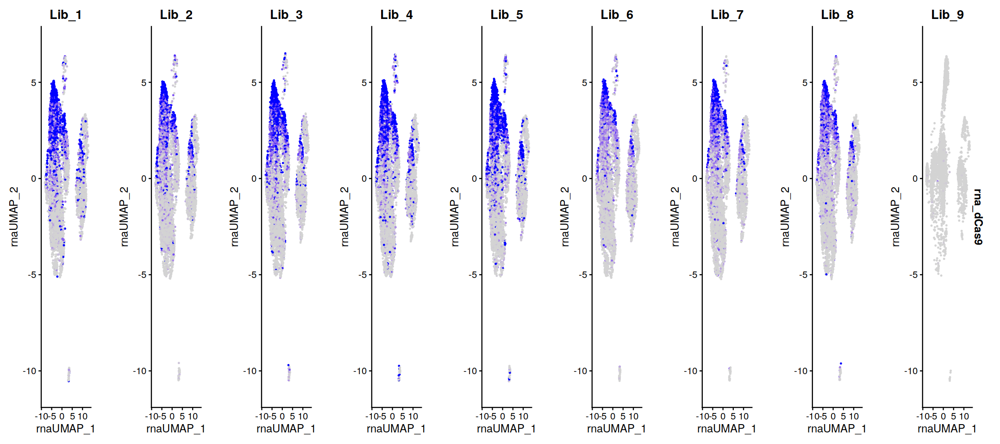

In [9]:
options(repr.plot.width=18, repr.plot.height=8)
DefaultAssay(seurat) <- 'RNA'
FeaturePlot(seurat, features='rna_dCas9', split.by = 'library', max.cutoff='q75')

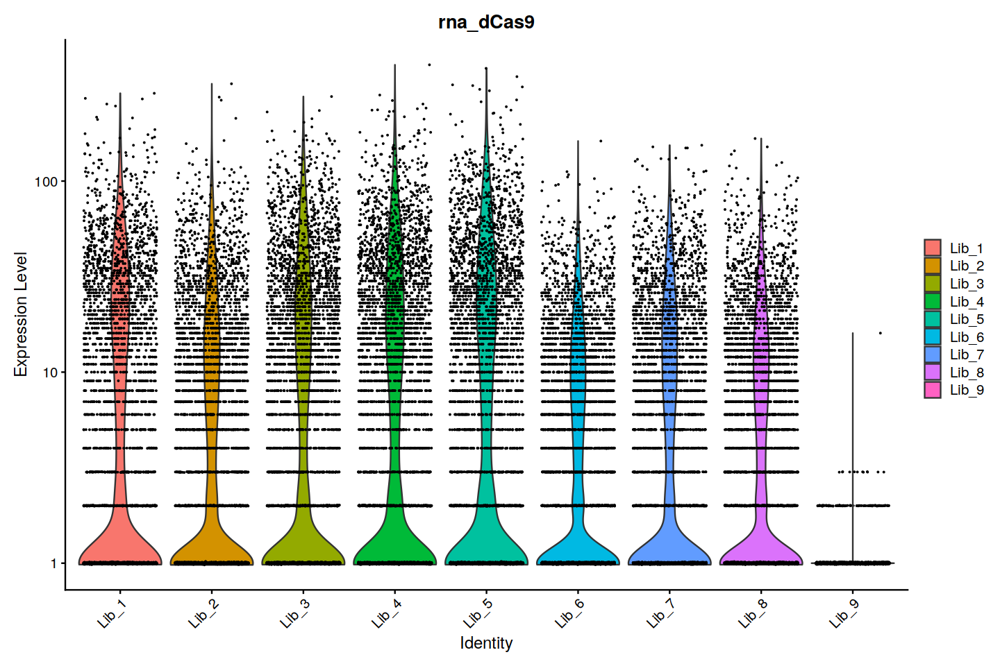

In [10]:
options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(seurat, features = 'rna_dCas9', group.by = 'library', log=T)

# Total guide count - dCas9 correlation

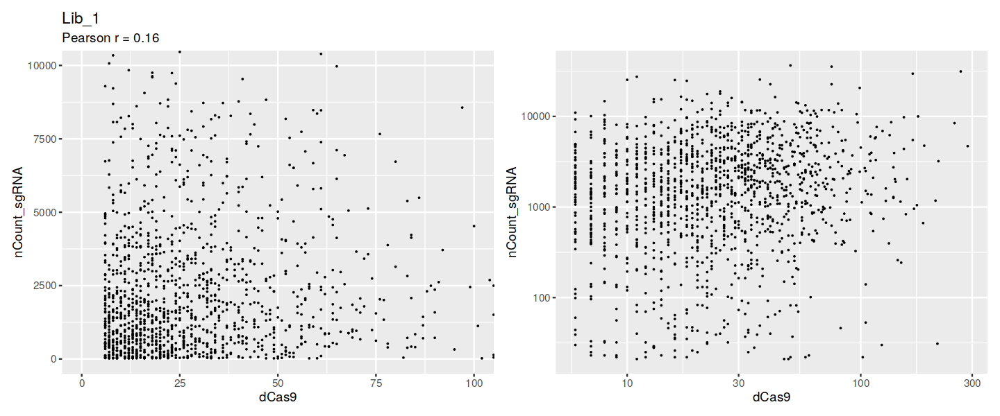

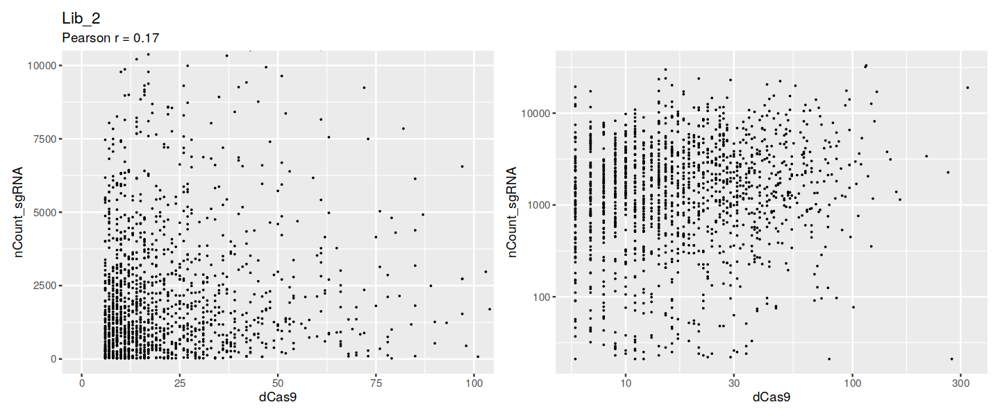

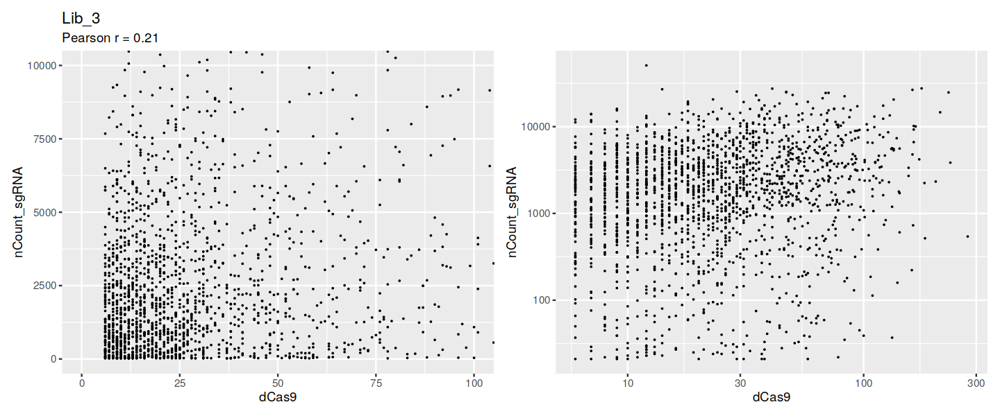

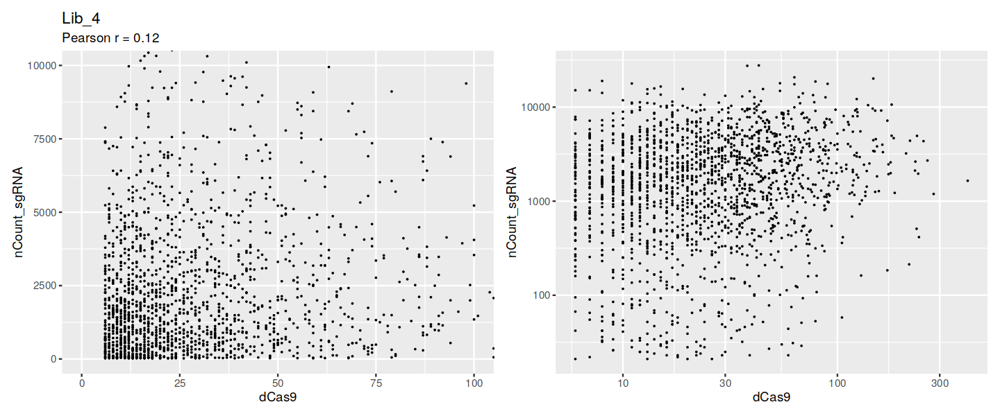

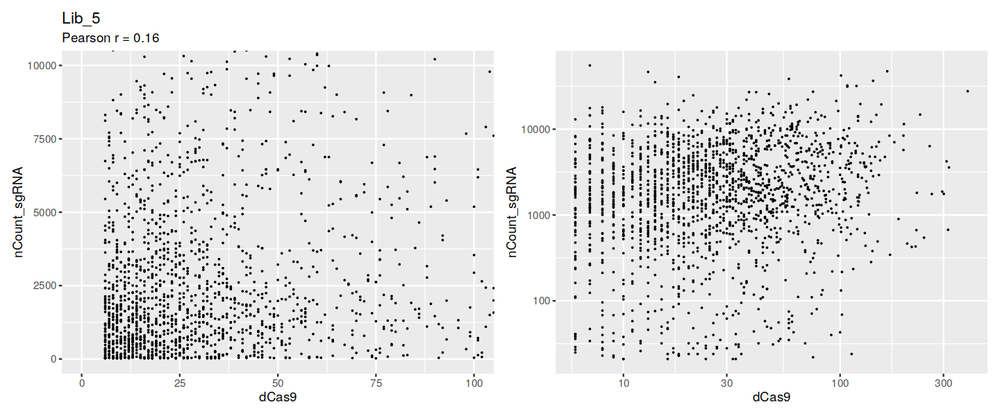

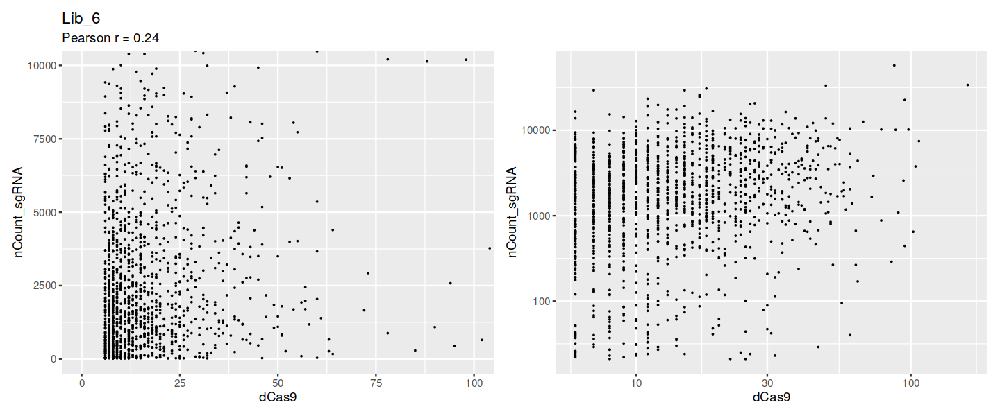

ERROR: Error: No cells found


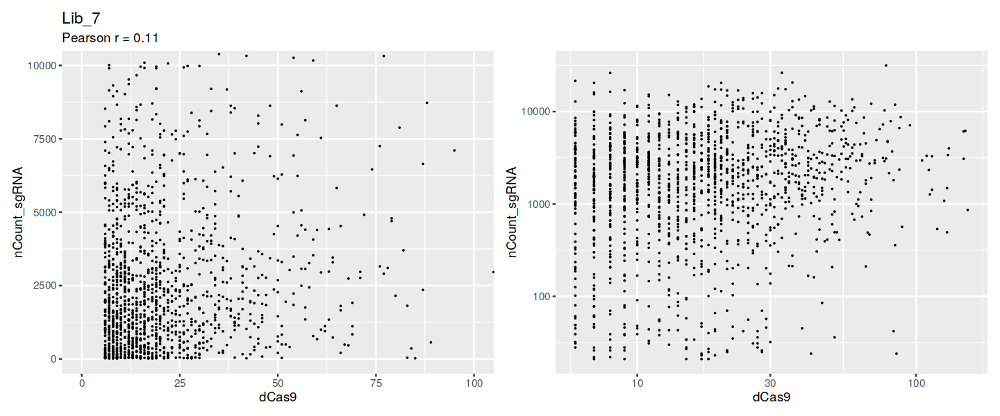

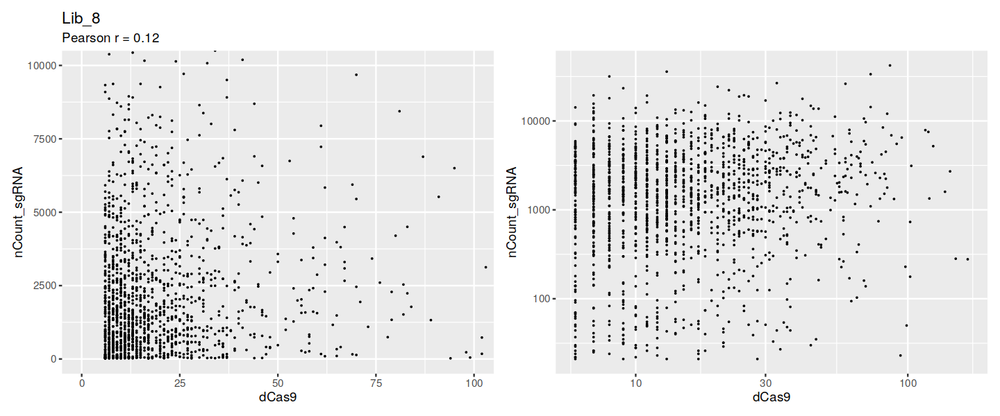

In [11]:
options(repr.plot.width=12, repr.plot.height=5)
libraries = unique(seurat$library)
min_dCas9 = 5
min_guide = 20
DefaultAssay(seurat) <- 'RNA'

for(l in seq_along(libraries)) {
    library_name = libraries[[l]]
    seurat_subset = subset(seurat, subset=(library==library_name) & (rna_dCas9 > min_dCas9) & (nCount_sgRNA > min_guide))
    pears = round(cor(seurat_subset$nCount_sgRNA, seurat_subset$dCas9, method='pearson'), 2)
    spear = round(cor(seurat_subset$nCount_sgRNA, seurat_subset$dCas9, method='spearman'), 2)
    title = library_name
    subtitle = paste("Pearson r =", pears)
    
    plt = ggplot(seurat_subset@meta.data, aes(x=dCas9, nCount_sgRNA)) +
            geom_point(size=0.001) + 
            coord_cartesian(ylim=c(0, 10000), xlim=c(0,100)) +         
            labs(title=library_name, subtitle=subtitle) +
          ggplot(seurat_subset@meta.data, aes(x=dCas9, nCount_sgRNA)) +
            geom_point(size=0.001) +
            scale_y_log10() +
            scale_x_log10() 
    
# ggplot(seurat_subset@meta.data, aes(x=dCas9, nCount_sgRNA)) +
#             geom_point(size=0.001) +
#             coord_cartesian(ylim=c(0,10000), xlim=c(0,250)) +

    print(plt)
    
}

In [18]:
head(seurat_subset@meta.data$dCas9)
head(seurat_subset@meta.data$nCount_sgRNA)

[1] 17 30  8 99 10 11

[1]  340 2047  396   50 4062  480

# dCas9 - guide expression correlation. (split by guides)

Seurat@misc$guides contains only screen 1 guides. Fix it.

In [19]:
perturbed_cells_by_guide = get_perturbed_cells(seurat, df_thresholds)

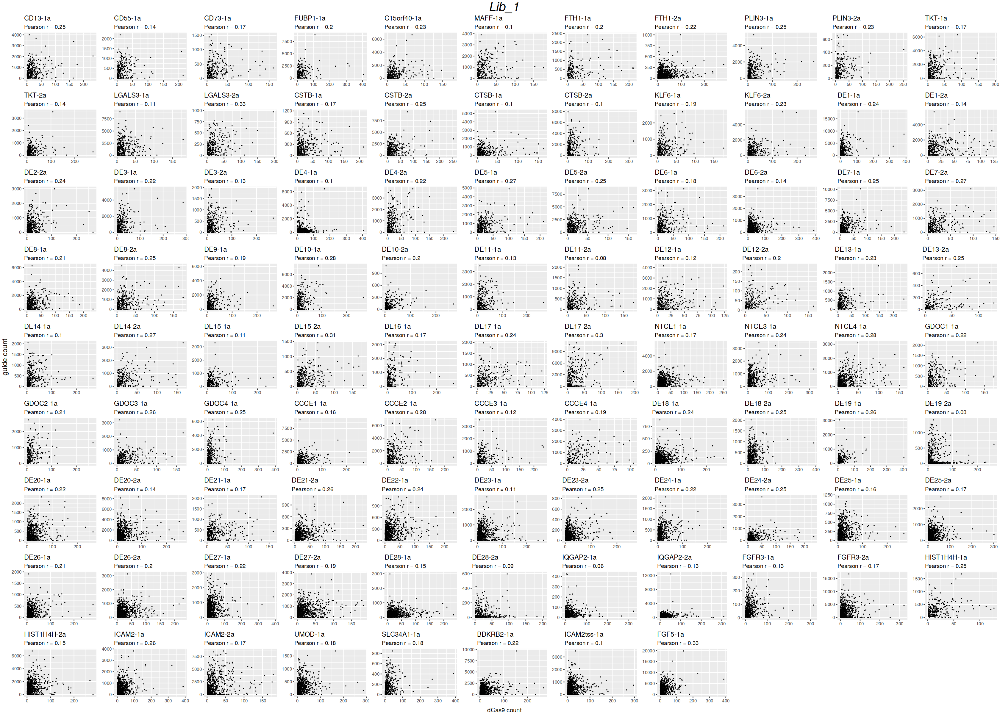

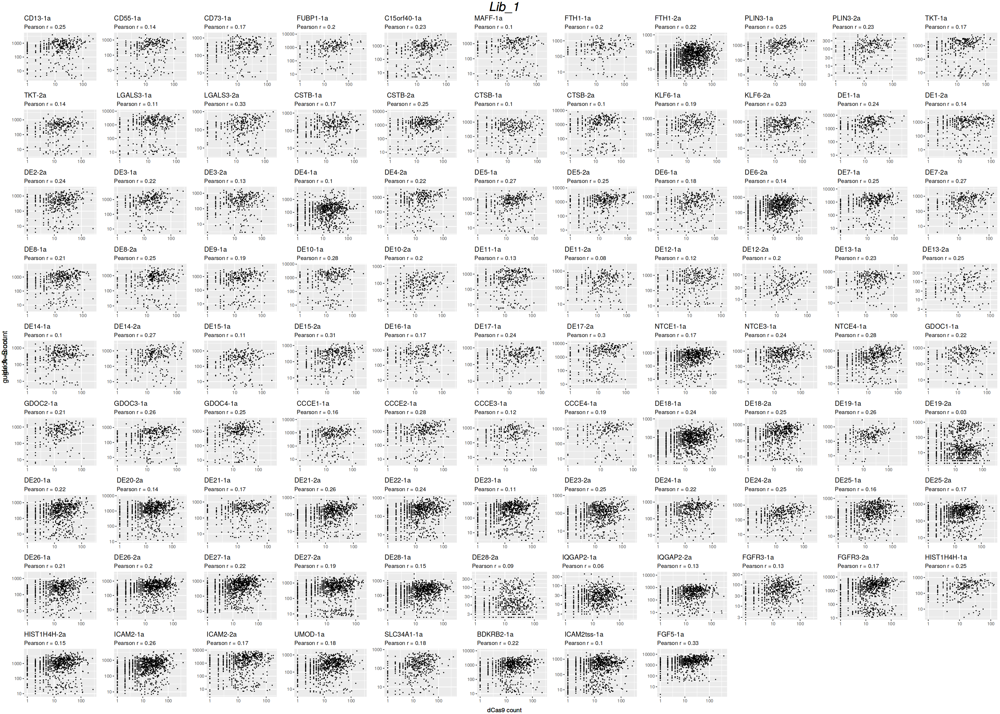

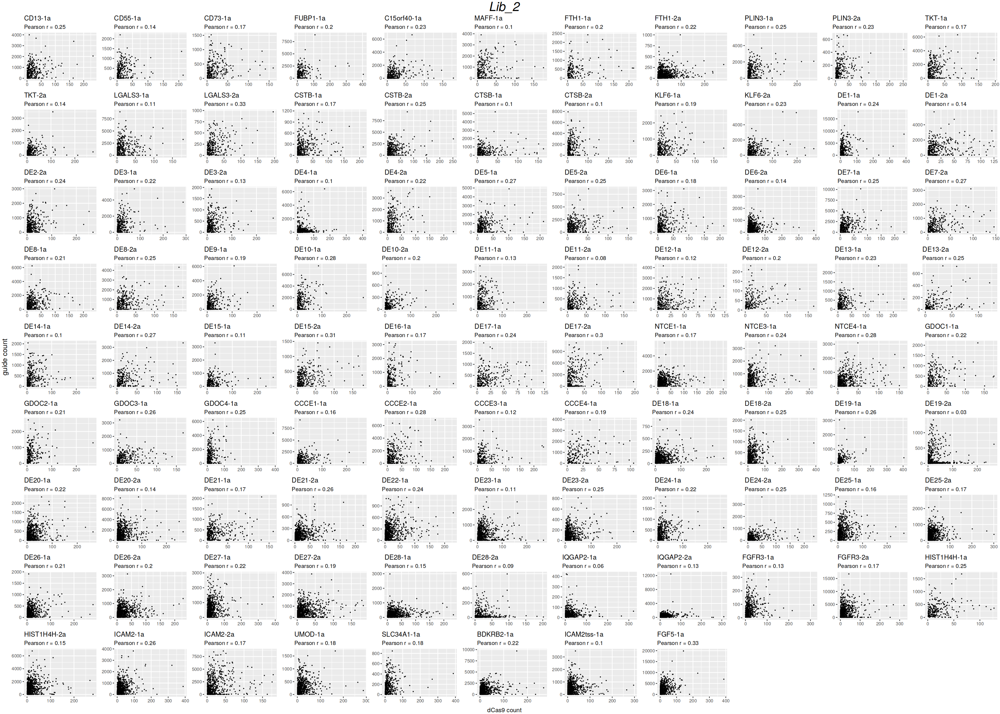

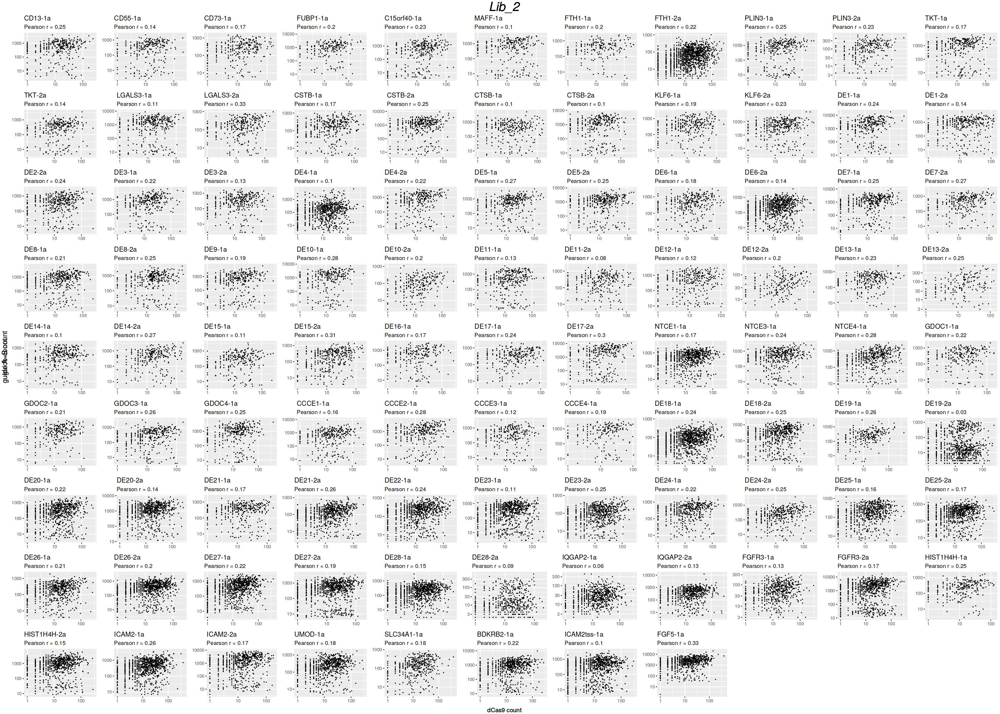

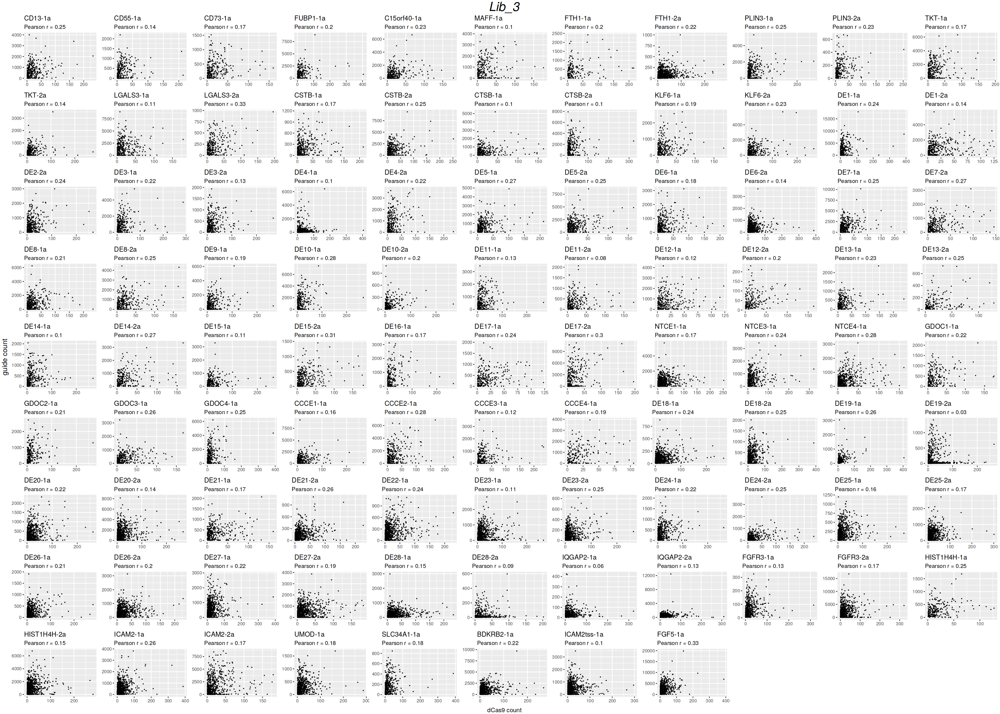

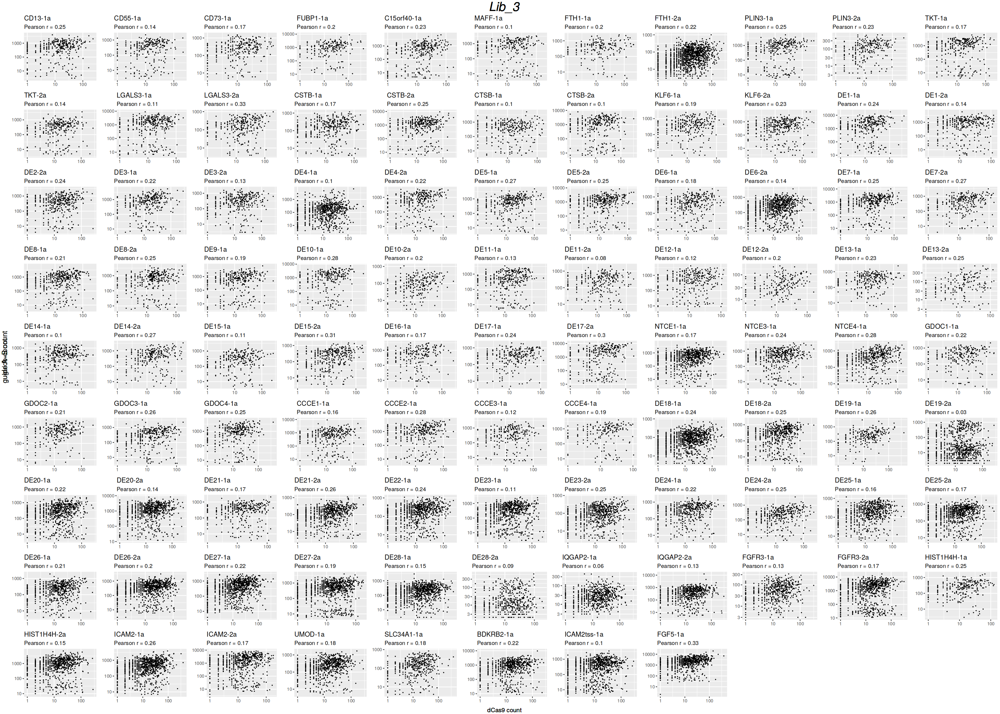

In [20]:
source('/home/vsevim/prj/workflows/ckd/secondary/helper_functions_for_diffex.r')
df_targeting = filter(df_guide, class=='targeting')
libraries = unique(seurat$library)

for(l in seq_along(libraries)){
    library_name = libraries[[l]]
    lin_plots = list()
    log_plots = list()

    for(i in 1:nrow(df_guide)) {
        guide = df_guide[i, 'guide1']

        #cat(blue(target,":"), paste(guides_on_plasmid, collapse=","),"\n")
        seurat_dummy <- mark_guide_pos_target_neg(
            seurat, 
            perturbed_cells_by_guide, 
            guide, 
            guide, 
            print_counts = F
        )

        if("guide_positive" %in% levels((Idents(seurat_dummy)))) {
            seurat_dummy$plasmid_stat = Idents(seurat_dummy)     
            select_cells = (seurat_dummy$plasmid_stat == 'guide_positive') & (seurat_dummy$dCas9 > 0)
            barcodes = colnames(seurat_dummy)[select_cells]
            df_dummy = data.frame(seurat_dummy[['sgRNA']]@counts[guide, barcodes])
            colnames(df_dummy) <- c("count")
            df_subset_cells = data.frame(seurat_dummy@meta.data[barcodes, c('dCas9', 'nCount_sgRNA')])
            df_subset_cells$selected_guide_count = df_dummy$count
            
            options(repr.plot.width=16, repr.plot.height=6)
            corrp = round(cor(df_subset_cells$dCas9, df_subset_cells$selected_guide_count, method = 'pearson'), 2)
            corrs = round(cor(log10(df_subset_cells$dCas9), log10(df_subset_cells$selected_guide_count), method = 'spearman'), 2)
            title = paste0(guide)
            subtitle = paste("Pearson r =", corrp)

            p1 = ggplot(df_subset_cells, aes(x=dCas9, selected_guide_count)) +
                    geom_point(size=0.01, na.rm=TRUE) +
                    labs(title=title, subtitle = subtitle, x=NULL, y=NULL) 

            p2 = ggplot(df_subset_cells, aes(x=dCas9, selected_guide_count)) +
                    geom_point(size=0.01, na.rm=TRUE) +
                    scale_y_log10() +
                    scale_x_log10() +
                    labs(title=title, subtitle = subtitle, x=NULL, y=NULL) 

            lin_plots <- append(lin_plots, list(p1))
            log_plots <- append(log_plots, list(p2))
        }
    }

    options(repr.plot.width=28, repr.plot.height=20)
    plt_lin <- gridExtra::grid.arrange(
        grobs = lin_plots,
        ncol = 11,
        bottom=textGrob("dCas9 count", gp=gpar(fontsize=12)),
        left=textGrob("guide count", gp=gpar(fontsize=14), rot=90),
        top = textGrob(library_name, gp=gpar(fontsize=25, font=3))
    )

    plt_log <- gridExtra::grid.arrange(
        grobs = log_plots, 
        ncol = 11, 
        bottom=textGrob("dCas9 count", gp=gpar(fontsize=12)),
        left=textGrob("guide A+B count", gp=gpar(fontsize=14), rot=90),
        top = textGrob(library_name, gp=gpar(fontsize=25, font=3))
    )

    suppressWarnings(grid::grid.draw(plt_lin))
    suppressWarnings(grid::grid.draw(plt_log))
}

In [ ]:
tail(df_subset_cells)

,dCas9,nCount_sgRNA,selected_guide_count
,<dbl>,<dbl>,<dbl>
TTCGATTTCCCGAAAT-1_4,24,6159,2797
TTCGCTGAGAATCTAG-1_4,171,27308,1775
TTTCACAAGTCTACCA-1_4,61,2316,1128
TTTCCTCCACTTTATC-1_4,723,13640,756
TTTGGAGAGACCGCCT-1_4,28,12857,1674
TTTGGTTCAGGCAATG-1_4,53,3786,1267


In [ ]:
tail(data.frame(seurat_dummy[['sgRNA']]@counts[guide, barcodes]))
tail(data.frame(seurat_dummy@meta.data[barcodes, c('dCas9', 'nCount_sgRNA')]))
1

,seurat_dummy...sgRNA....counts.guide..barcodes.
,<dbl>
TTCGATTTCCCGAAAT-1_4,2797
TTCGCTGAGAATCTAG-1_4,1775
TTTCACAAGTCTACCA-1_4,1128
TTTCCTCCACTTTATC-1_4,756
TTTGGAGAGACCGCCT-1_4,1674
TTTGGTTCAGGCAATG-1_4,1267


,dCas9,nCount_sgRNA
,<dbl>,<dbl>
TTCGATTTCCCGAAAT-1_4,24,6159
TTCGCTGAGAATCTAG-1_4,171,27308
TTTCACAAGTCTACCA-1_4,61,2316
TTTCCTCCACTTTATC-1_4,723,13640
TTTGGAGAGACCGCCT-1_4,28,12857
TTTGGTTCAGGCAATG-1_4,53,3786


[1] 1

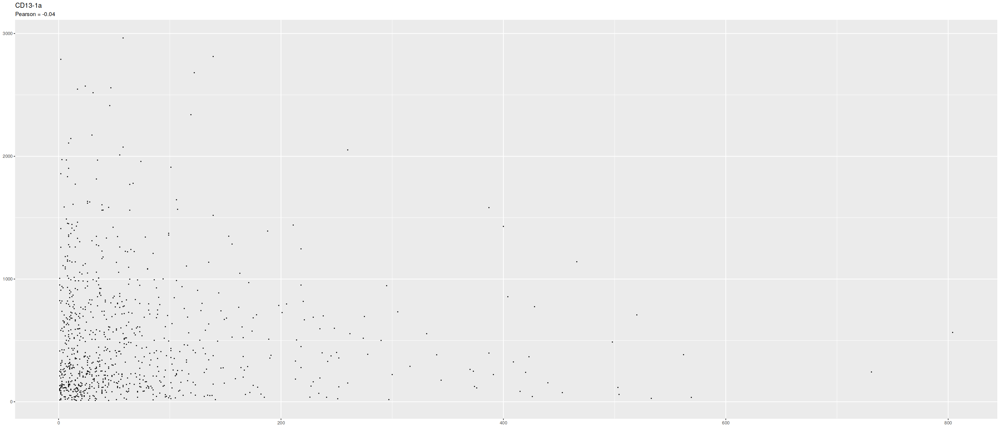

In [ ]:
lin_plots[[1]]

# Debug

In [ ]:
seurat@misc

,gene,guide1,guide2,alias,subclass,class,gene_or_rsid,label
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,CD13,CD13-1a,CD13-1b,ANPEP,tss,targeting,ANPEP,Control TSS
2,CD55,CD55-1a,CD55-1b,CD55,tss,targeting,CD55,Control TSS
3,CD73,CD73-1a,CD73-1b,NT5E,tss,targeting,NT5E,Control TSS
4,FUBP1,FUBP1-1a,FUBP1-1b,FUBP1,tss,targeting,FUBP1,Control TSS
5,C15orf40,C15orf40-1a,C15orf40-1b,C15orf40,tss,targeting,C15orf40,Control TSS
6,MAFF,MAFF-1a,MAFF-1b,MAFF,tss,targeting,MAFF,Control TSS
7,Enh-23-8-FTH1,FTH1-1a,FTH1-1b,FTH1,de_control,targeting,FTH1,Control DE
8,Enh-23-8-FTH1,FTH1-2a,FTH1-2b,FTH1,de_control,targeting,FTH1,Control DE
9,Enh37-10-PLIN3,PLIN3-1a,PLIN3-1b,PLIN3,de_control,targeting,PLIN3,Control DE
